# Capstone Project - The Battle Of Neighboring Cities and Austin, TX BBQs

## Need to identify key surrounding cities around Austin, TX

In [1]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
from bs4 import BeautifulSoup

import random # library for random number generation

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes
!pip install geopy
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values
from geopy import distance

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium --yes
!pip install folium==0.5
import folium # map rendering library

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
from IPython.display import display_html

print('Libraries imported.')

Libraries imported.


#### Need to identify cities of interest that are within a radius of Austin, TX including Austin itself.  Note: The distance is not reflective of actual driving distance due to actual road layout versus straight-line distance 
#### These are global parameters that can be modified for different investigations

In [2]:
city = 'Austin'
state = 'TX'
state_long = 'Texas'
address = city + ", " + state_long
radius = 50 # in miles     # The distamce from the main city for city comparisons
LIMIT = 100                # limit of number of venues returned by Foursquare API
city_radius = 24000         # radius of the city being discovered and is in meters with 16 km = 10 mi  
# NOTE: this distance may or may not overlap between adjacent cities
search_query = 'BBQ Joint'  # The type of venue being discovered, See https://developer.foursquare.com/docs/build-with-foursquare/categories/
#search_query = 'Steakhouse'
#search_query = 'Italian'
search_venue = 'Food'       # A higher oreder search query to find places of interest for clustering
#search_venue = 'Nightlife Spot'

#### Need Texas city information with latitude and longitude coordinates

#### Scrape websites in order to obtain the data that is in a table of surrounding cities (including Austin) then transform the data into a pandas dataframe

#### For web scraping, use the BeautifulSoup package. The package's main documentation page is at: http://beautiful-soup-4.readthedocs.io/en/latest/

#### Printed several web pages to inspect the web page however, the following web pages were "forbidden" to scrap so switched to a US cities file downloaded to this notebook to read

In [3]:
#URL = "https://bettysellsaustin.com/towns-around-austin-texas/"
#URL = "https://www.newhomesource.com/learn/best-austin-suburbs/"
#URL = "https://www.niche.com/places-to-live/search/best-suburbs/m/austin-metro-area/"
#page = requests.get(URL).text
#print(page) 

#### SInce scraping is not an option, I will be using a cvs file obtained from https://simplemaps.com/data/us-cities

#### Need Texas city information with latitude and longitude coordinates by using a cvs file obtained from https://simplemaps.com/data/us-cities

In [4]:
import os

base_path = "C:\\Users\\bpjoh\Downloads"
filename = "uscities.csv"
path_to_file = os.path.join(base_path, filename)

df_UScity_data = pd.read_csv(path_to_file)

In [5]:
print(df_UScity_data.shape)
print("Using a cvs file obtained from https://simplemaps.com/data/us-cities")
#df_UScity_data.head()

(28372, 17)
Using a cvs file obtained from https://simplemaps.com/data/us-cities


#### Let's set data types, sort, and add data columns

In [6]:
df_UScity_data['city'] = df_UScity_data['city'].astype("string")
df_UScity_data['state_id'] = df_UScity_data['state_id'].astype("string")
df_UScity_data['state_name'] = df_UScity_data['state_name'].astype("string")
df_UScity_data.loc[:,'city_of_interest'] = False
df_UScity_data = df_UScity_data.sort_values(by=['city'])
df_UScity_data.reset_index(drop=True, inplace=True)

In [7]:
print("df_UScity_data.shape : ",df_UScity_data.shape)
#df_UScity_data.head()
#df_UScity_data.dtypes

df_UScity_data.shape :  (28372, 18)


In [8]:
geolocator = Nominatim(user_agent="explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

#center_point = [{'lat': location.latitude, 'lng': location.longitude}]
center_point = [{'lat': latitude, 'lng': longitude}]

# Look through the cities file to find close cities to the main city fo interest
for city, lat, lng in zip(df_UScity_data['city'], df_UScity_data['lat'], df_UScity_data['lng']):   
    
    test_point = [{'lat': lat, 'lng': lng }]

    center_point_tuple = tuple(center_point[0].values())
    test_point_tuple = tuple(test_point[0].values())

    dis = distance.distance(center_point_tuple, test_point_tuple).mi

    # If within the desired distance than mark as True
    if dis <= radius:df_UScity_data.loc[ (df_UScity_data.city == city) & (df_UScity_data.state_id == state), 'city_of_interest'] = True
          

In [9]:
# the following is needed to place the city marker right on top of the main label marker in subsequent map visuals
df_UScity_data.loc[ (df_UScity_data.city == city) & (df_UScity_data.state_id == state), 'lat'] = latitude
df_UScity_data.loc[ (df_UScity_data.city == city) & (df_UScity_data.state_id == state), 'lng'] = longitude

In [10]:
print('The geograpical location of {} is {}, {}.'.format(address, latitude, longitude))

print("df_UScity_data.shape : ",df_UScity_data.shape)

df_cities_of_interest = df_UScity_data[['lat', 'lng', 'city', 'city_of_interest']]
df_cities_of_interest = df_cities_of_interest[df_cities_of_interest.city_of_interest == True]

print("df_cities_of_interest.shape : ",df_cities_of_interest.shape)

#df_cities_of_interest.head(100)
#df_cities_of_interest.dtypes

The geograpical location of Austin, Texas is 30.2711286, -97.7436995.
df_UScity_data.shape :  (28372, 18)
df_cities_of_interest.shape :  (93, 4)


#### What are the surrounding city names including Austin and how many?

In [11]:
print("There are {} cities including {} itself within a {} mile radius of {}".format(df_cities_of_interest[df_cities_of_interest.city_of_interest == True].shape[0], address, radius, address))
#for city, city_of_interest in zip( df_cities_of_interest['city'], df_cities_of_interest['city_of_interest']):
#    if city_of_interest == True:
#        print("City : {}".format(city))

There are 93 cities including Austin, Texas itself within a 50 mile radius of Austin, Texas


#### Create a map of Austin using latitude and longitude values with the cities of interest superimposed on top - visual check on neighborrhoods

In [12]:
# create map of Austin using latitude and longitude values
map_address_city = folium.Map(location=[latitude, longitude], zoom_start=8)

# add a red circle marker to represent the main city
folium.CircleMarker(
    [latitude, longitude],
    radius=10,
    color='red',
    popup= address,
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(map_address_city)

# add surrounding city markers as green circles to map
for lat, lng, city, city_of_interest in zip(df_cities_of_interest['lat'], df_cities_of_interest['lng'], df_cities_of_interest['city'], df_cities_of_interest['city_of_interest']):
    if city_of_interest == True:
        label = '{}'.format(city)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='green',
            fill=True,
            fill_color='green',
            fill_opacity=0.7,
            parse_html=False).add_to(map_address_city)  
    
map_address_city

## Start utilizing the Foursquare API to explore the citie venues and segment them.

#### Foursquare documentation is found at https://developer.foursquare.com/docs/ and https://developer.foursquare.com/docs/places-api/endpoints/
#### The credentials are set in the next code cell but will be hidden from the public.

In [13]:
# @hidden_cell
CLIENT_ID = '3F4N0TPYF5LSNQ4N4DX145DBAORHQDKXAE5ZYL0REVW35HDG' # your Foursquare ID
CLIENT_SECRET = 'YZPBY4ISZVZKRFIYPLXTINCCUHODQKVUCDGAUTT0QBLYKT45' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

#print('Your credentails:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)

#### Let's explore Austin - let's get the top "LIMIT" 'BBQ Joint' venues that are within the city_radius distance

In [14]:
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(
    CLIENT_ID,  
    CLIENT_SECRET,  
    latitude, 
    longitude, 
    VERSION,
    search_query,
    city_radius, 
    LIMIT
)
#url

#### Send the GET request and examine the resutls

In [15]:
address_results = requests.get(url)
print('Verify JSON decoding return : ', address_results.status_code)
address_results = address_results.json()
print('JSON data type : ', type(address_results))

Verify JSON decoding return :  200
JSON data type :  <class 'dict'>


In [16]:
print(json.dumps(address_results, sort_keys=True, indent=4))
#for venues in address_results['response']['venues'] :
#    print("venues : ",venues)

{
    "meta": {
        "code": 200,
        "requestId": "600b6372f7c8ca3b750eb485"
    },
    "response": {
        "venues": [
            {
                "categories": [
                    {
                        "icon": {
                            "prefix": "https://ss3.4sqi.net/img/categories_v2/food/bbqalt_",
                            "suffix": ".png"
                        },
                        "id": "4bf58dd8d48988d1df931735",
                        "name": "BBQ Joint",
                        "pluralName": "BBQ Joints",
                        "primary": true,
                        "shortName": "BBQ"
                    }
                ],
                "hasPerk": false,
                "id": "5f0a1ac0286ad646dda44259",
                "location": {
                    "cc": "US",
                    "city": "Austin",
                    "country": "United States",
                    "distance": 24371,
                    "formattedAddress": [
          

#### From the Foursquare lab, we know that all the information is in the items key. Before we proceed, let's borrow the get_category_type function from the Foursquare lab.

In [17]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

#### Now we are ready to clean the json and structure it into a pandas dataframe.

In [18]:
venues = address_results['response']['venues']

nearby_venues = pd.json_normalize(venues)

#print(nearby_venues.dtypes)
print("nearby_venues.shape : ",nearby_venues.shape)
#nearby_venues.head()

nearby_venues.shape :  (50, 25)


In [19]:
# filter columns
filtered_columns = ['name', 'categories', 'location.lat', 'location.lng']
nearby_venues_filtered = nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues_filtered['categories'] = nearby_venues_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
nearby_venues_filtered.columns = [column.split('.')[-1] for column in nearby_venues_filtered.columns]

nearby_venues_filtered = nearby_venues_filtered[nearby_venues_filtered['categories'] == search_query ]
nearby_venues_filtered = nearby_venues_filtered.sort_values(by=['name'])
nearby_venues_filtered.reset_index(drop=True, inplace=True)

In [20]:
print("nearby_venues_filtered.shape : ",nearby_venues_filtered.shape)
print("There are {} \'{}\' venues within a {} mile radius of {}".format(nearby_venues_filtered.shape[0], search_query, city_radius/1600, address))
#nearby_venues_filtered

nearby_venues_filtered.shape :  (28, 4)
There are 28 'BBQ Joint' venues within a 15.0 mile radius of Austin, Texas


#### Let's visualize the venues around Austin

In [21]:
map_address_venues = folium.Map(location=[latitude, longitude], zoom_start=12) # generate map centred around the main city

# add a red circle marker to represent the main city
folium.CircleMarker(
    [latitude, longitude],
    radius=10,
    color='red',
    popup= address,
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(map_address_venues)

# add the venues as blue circle markers
for lat, lng, name in zip(nearby_venues_filtered.lat, nearby_venues_filtered.lng, nearby_venues_filtered.name):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2.5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(map_address_venues)

# display map
map_address_venues

## Let's explore the surrounding cities around Austin

####  Let's get up to no more than the top "LIMIT" 'BBQ Joint' venues that are within the city_radius distance of each surrounding city

#### Note: the same venues may be found in adjacent cities

#### Now write the code to run on each city surrounding Austin and create a new dataframe

In [22]:
surrounding_venue_results = {}
for city, lat, long in zip(df_cities_of_interest.city, df_cities_of_interest.lat, df_cities_of_interest.lng):
    #print("city : ",city)
    url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(
        CLIENT_ID,  
        CLIENT_SECRET,  
        lat, 
        long, 
        VERSION,
        search_query,
        city_radius, 
        LIMIT
    )  
    surrounding_results = requests.get(url)
    #print('Verify JSON decoding return : ', surrounding_results.status_code)
    surrounding_results = surrounding_results.json()
    #print('JSON data type : ', type(surrounding_results))
    surrounding_venues = surrounding_results['response']['venues']
    surrounding_nearby_venues = pd.json_normalize(surrounding_venues)
    #print(surrounding_nearby_venues.dtypes)
    #print("surrounding_nearby_venues.shape : ",surrounding_nearby_venues.shape)
    #print(surrounding_nearby_venues.head())
    if surrounding_nearby_venues.empty :
        print ("{} has no venues of interest ".format(city))
    else :
        filtered_columns = ['name', 'categories'] + [col for col in surrounding_nearby_venues.columns if col.startswith('location.')] + ['id']
        surrounding_nearby_venues_filtered = surrounding_nearby_venues.loc[:, filtered_columns]
        # filter the category for each row
        surrounding_nearby_venues_filtered['categories'] = surrounding_nearby_venues_filtered.apply(get_category_type, axis=1)
        # clean column names by keeping only last term
        surrounding_nearby_venues_filtered.columns = [column.split('.')[-1] for column in surrounding_nearby_venues_filtered.columns]
        surrounding_nearby_venues_filtered = surrounding_nearby_venues_filtered[surrounding_nearby_venues_filtered['categories'] == search_query ]
        surrounding_nearby_venues_filtered = surrounding_nearby_venues_filtered.sort_values(by=['name'])
        surrounding_nearby_venues_filtered.reset_index(drop=True, inplace=True)
        #print(surrounding_nearby_venues_filtered)
        surrounding_venue_results[city] = surrounding_nearby_venues_filtered

In [23]:
#for city in surrounding_venue_results :
    #venue = surrounding_venue_results[city]
    #print("There are {} \'{}\' venues within a {} mile radius of {}".format(venue.shape[0], search_query, city_radius/1600, city))
    #print(venue.dtypes)
    #print(venue)
    #print(city)
    #for lat, lng, label in zip(venue.lat, venue.lng, venue.name):
    #    print("     {}".format(label))
    #    print("venue name : {}, lat = {}, lng = {}".format(label, lat, lng))

#### Let's visualize these venues along with the surrounding cities - remember, adjacent cities may claim a similar venue

In [24]:
map_surrounding_venues = folium.Map(location=[latitude, longitude], zoom_start=12) # generate map centred around the main city

# add a red circle marker to represent the main city
folium.CircleMarker(
    [latitude, longitude],
    radius=10,
    color='red',
    popup= address,
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(map_surrounding_venues)

# add surrounding city markers as green circles to map
for lat, lng, city, city_of_interest in zip(df_cities_of_interest['lat'], df_cities_of_interest['lng'], df_cities_of_interest['city'], df_cities_of_interest['city_of_interest']):
    if city_of_interest == True:
        label = '{}'.format(city)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='green',
            fill=True,
            fill_color='green',
            fill_opacity=0.7,
            parse_html=False).add_to(map_surrounding_venues)  
    
    
# add the venues as blue circle markers
for city in surrounding_venue_results :
    venue = surrounding_venue_results[city]
    for lat, lng, name in zip(venue.lat, venue.lng, venue.name):
        label1 = '{}'.format(name)
        label = folium.Popup(label1, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=2.5,
            color='blue',
            popup=label,
            fill = True,
            fill_color='blue',
            fill_opacity=0.6
        ).add_to(map_surrounding_venues)

# display map
map_surrounding_venues

#### How many 'BBQ Joint' venues are within each of the different cities?

In [25]:
dict_venue_per_city = []
for city in surrounding_venue_results :
    venue = surrounding_venue_results[city]
    for name in venue.name :
        dict_venue_per_city.append([city, name])

venue_per_city = pd.DataFrame(dict_venue_per_city, columns = ['City', 'Venue name'])      
print(venue_per_city.shape)
venue_per_city.head()

(2261, 2)


,City,Venue name
0,Austin,Adoo's Bbq
1,Austin,Archie’s BBQ
2,Austin,Bert's BBQ
3,Austin,Best Dam BBQ Joint
4,Austin,Big Bad BBQ


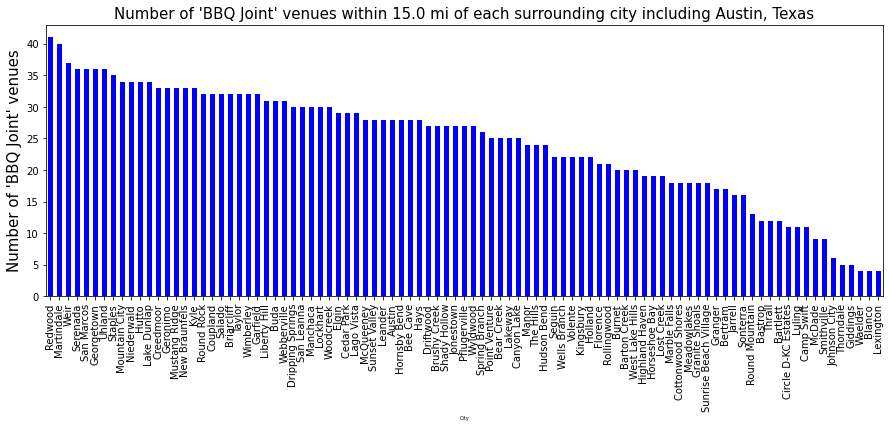

In [26]:
import matplotlib.pyplot as plt

clr="blue"
df_venue_per_city = venue_per_city.groupby(["City"]).count()
df_venue_per_city = df_venue_per_city.sort_values(by=['Venue name'],ascending=False)
df_venue_per_city.plot.bar(figsize=(15,5), color=clr, legend=None)
plt.title('Number of \'{}\' venues within {} mi of each surrounding city including {}'.format(search_query,city_radius/1600,address), fontsize = 15)
plt.xlabel('City',fontsize = 5)
plt.ylabel('Number of \'{}\' venues'.format(search_query),fontsize = 15)
plt.xticks(rotation=90)
plt.show()

## There are lists of top rated BBQ place's in Texas on the Web, which ones are around Austin?

#### Compiled a list of top rated BBQ joints in all of Texas using Web searches
#### Note there is no lat, lng information and be careful on matching venue names to what Foursquare reports
#### None of the sites allowed scrapping so had to generate this list by hand

In [27]:
import os

base_path = "C:\\Users\\bpjoh\Downloads"
filename = "BestTexasBBQJoints.xlsx"
path_to_file = os.path.join(base_path, filename)

df_Top_Texas_BBQ = pd.read_excel(path_to_file)
df_Top_Texas_BBQ['BBQ Joint'] = df_Top_Texas_BBQ['BBQ Joint'].astype("string")
df_Top_Texas_BBQ['City'] = df_Top_Texas_BBQ['City'].astype("string")

In [28]:
print(df_Top_Texas_BBQ.shape)
#print(df_Top_Texas_BBQ.dtypes)
df_Top_Texas_BBQ.head()

(95, 2)


,BBQ Joint,City
0,Spicy Mikes BBQ Haven,Amarillo
1,Tyler’s Barbeque,Amarillo
2,Black’s BBQ,Austin
3,Brown's Bar-B-Que,Austin
4,Cooper’s Old Time Pit Bar-B-Que,Austin


#### Quick look at cities with top BBQ places in Texas

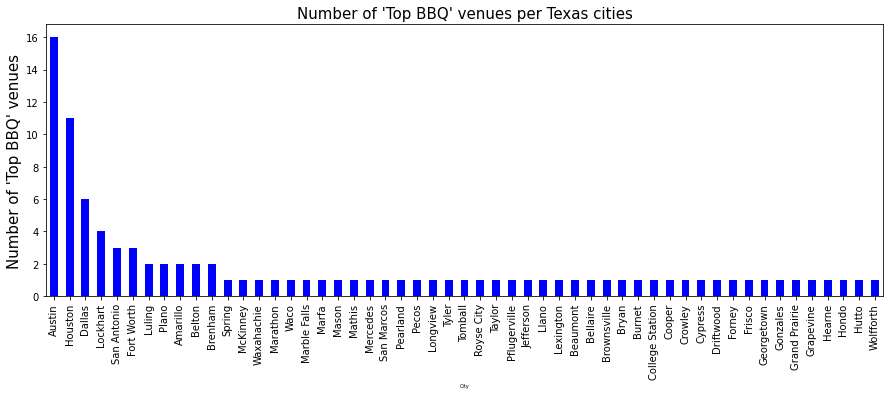

In [29]:
clr="blue"
#df_Top_Texas_BBQ = df_Top_Texas_BBQ.sort_values(by=['City'])
df_Top_Texas_BBQ_group = df_Top_Texas_BBQ.groupby(["City"]).count()
df_Top_Texas_BBQ_group = df_Top_Texas_BBQ_group.sort_values(by=['BBQ Joint'],ascending=False)
df_Top_Texas_BBQ_group.plot.bar(figsize=(15,5), color=clr, legend=None)
plt.title('Number of \'Top BBQ\' venues per Texas cities', fontsize = 15)
plt.xlabel('City',fontsize = 5)
plt.ylabel('Number of \'Top BBQ\' venues',fontsize = 15)
plt.xticks(rotation=90)
plt.show()

In [30]:
for city in surrounding_venue_results :
    print("For the city : {}".format(city))
    venue = surrounding_venue_results[city]
    for lat, lng, name in zip(venue.lat, venue.lng, venue.name):
        for top_name in df_Top_Texas_BBQ['BBQ Joint'] :
            if name == top_name :
                print("     The surrounding venue: {}, is a Texas Top BBQ place".format(name))

For the city : Austin
     The surrounding venue: Lambert's Downtown BBQ, is a Texas Top BBQ place
     The surrounding venue: Terry Black's BBQ, is a Texas Top BBQ place
For the city : Bartlett
     The surrounding venue: Louie Mueller Barbecue, is a Texas Top BBQ place
For the city : Barton Creek
     The surrounding venue: Lambert's Downtown BBQ, is a Texas Top BBQ place
     The surrounding venue: Stiles Switch BBQ & Brew, is a Texas Top BBQ place
     The surrounding venue: Terry Black's BBQ, is a Texas Top BBQ place
For the city : Bastrop
For the city : Bear Creek
     The surrounding venue: Valentina's Tex Mex BBQ, is a Texas Top BBQ place
For the city : Bee Cave
     The surrounding venue: Lambert's Downtown BBQ, is a Texas Top BBQ place
     The surrounding venue: Terry Black's BBQ, is a Texas Top BBQ place
For the city : Bertram
For the city : Blanco
For the city : Briarcliff
     The surrounding venue: Stiles Switch BBQ & Brew, is a Texas Top BBQ place
For the city : Brushy 

For the city : Staples
     The surrounding venue: City Market, is a Texas Top BBQ place
     The surrounding venue: City Market BBQ, is a Texas Top BBQ place
     The surrounding venue: Hays Co. Bar-B-Que, is a Texas Top BBQ place
     The surrounding venue: Kreuz Market, is a Texas Top BBQ place
For the city : Sunrise Beach Village
For the city : Sunset Valley
     The surrounding venue: Lambert's Downtown BBQ, is a Texas Top BBQ place
     The surrounding venue: Terry Black's BBQ, is a Texas Top BBQ place
     The surrounding venue: Valentina's Tex Mex BBQ, is a Texas Top BBQ place
For the city : Taylor
     The surrounding venue: Louie Mueller Barbecue, is a Texas Top BBQ place
     The surrounding venue: Pustka Family BBQ, is a Texas Top BBQ place
     The surrounding venue: The Salt Lick, is a Texas Top BBQ place
For the city : The Hills
     The surrounding venue: Lambert's Downtown BBQ, is a Texas Top BBQ place
     The surrounding venue: Terry Black's BBQ, is a Texas Top BBQ p

#### Let's add the visualize the Top Texas BBQ palces onto the places identified so far

In [31]:
map_Top_BBQ_venues = folium.Map(location=[latitude, longitude], zoom_start=12) # generate map centred around the main city

# add a red circle marker to represent the main city
folium.CircleMarker(
    [latitude, longitude],
    radius=10,
    color='red',
    popup= address,
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(map_Top_BBQ_venues)

# add surrounding city markers as green circles to map
for lat, lng, city, city_of_interest in zip(df_cities_of_interest['lat'], df_cities_of_interest['lng'], df_cities_of_interest['city'], df_cities_of_interest['city_of_interest']):
    if city_of_interest == True:
        label = '{}'.format(city)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='green',
            fill=True,
            fill_color='green',
            fill_opacity=0.7,
            parse_html=False).add_to(map_Top_BBQ_venues)  
    
    
# add the venues as blue circle markers
for city in surrounding_venue_results :
    venue = surrounding_venue_results[city]
    for lat, lng, name in zip(venue.lat, venue.lng, venue.name):
        label1 = '{}'.format(name)
        label = folium.Popup(label1, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=2.5,
            color='blue',
            popup=label,
            fill = True,
            fill_color='blue',
            fill_opacity=0.6
        ).add_to(map_Top_BBQ_venues)

# Now lets add a purple circle to the venues that have been classified as a Top BBQ
for city in surrounding_venue_results :
    venue = surrounding_venue_results[city]
    for lat, lng, name in zip(venue.lat, venue.lng, venue.name):
        for top_name in df_Top_Texas_BBQ['BBQ Joint'] :
            if name == top_name :
                label1 = '{}'.format(name)
                label = folium.Popup(label1, parse_html=True)
                folium.CircleMarker(
                    [lat, lng],
                    radius=5,
                    color='purple',
                    popup=label,
                    fill = True,
                    fill_color='purple',
                    fill_opacity=0.6
                ).add_to(map_Top_BBQ_venues)

# display map
map_Top_BBQ_venues

## Now let's explore all venues of interest in the cities of interest to determine areas for eating out

In [32]:
total_venue_results = {}
for city, lat, long in zip(df_cities_of_interest.city, df_cities_of_interest.lat, df_cities_of_interest.lng):
    #print("city : ",city)
    url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(
        CLIENT_ID,  
        CLIENT_SECRET,  
        lat, 
        long, 
        VERSION,
        search_venue,  
        city_radius, 
        LIMIT
    )  
    total_results = requests.get(url)
    #print('Verify JSON decoding return : ', total_results.status_code)
    total_results = total_results.json()
    #print('JSON data type : ', type(total_results))
    total_venues = total_results['response']['venues']
    total_nearby_venues = pd.json_normalize(total_venues)
    #print(total_nearby_venues.dtypes)
    #print("total_nearby_venues.shape : ",total_nearby_venues.shape)
    #print(total_nearby_venues.head())
    if total_nearby_venues.empty :
        print ("{} has no venues of interest ".format(city))
    else :
        filtered_columns = ['name', 'categories'] + [col for col in total_nearby_venues.columns if col.startswith('location.')] + ['id']
        total_nearby_venues_filtered = total_nearby_venues.loc[:, filtered_columns]
        # filter the category for each row
        total_nearby_venues_filtered['categories'] = total_nearby_venues_filtered.apply(get_category_type, axis=1)
        # clean column names by keeping only last term
        total_nearby_venues_filtered.columns = [column.split('.')[-1] for column in total_nearby_venues_filtered.columns]
        total_nearby_venues_filtered = total_nearby_venues_filtered.sort_values(by=['name'])
        total_nearby_venues_filtered.reset_index(drop=True, inplace=True)
        #print(total_nearby_venues_filtered)
        total_venue_results[city] = total_nearby_venues_filtered

In [33]:
#for city in total_venue_results :
    #print(city)
    #venue = total_venue_results[city]
    #print("     There are {} venues of interest within a {} mile radius of {}".format(venue.shape[0], city_radius/1600, city))
    #print(venue.dtypes)
    #print(venue)
    #print("Category : {} Venue name : {}".format(venue.categories, venue.name))
    #for category, name in zip(venue.categories, venue.name):
    #    print("Category : {}                   Venue name : {}".format(category, name))

#### How many venues are within each of the different cities?

In [34]:
dict_total_venue_per_city = []
for city in total_venue_results :
    venue = total_venue_results[city]
    for category, name, lat, lng in zip(venue.categories, venue.name, venue.lat, venue.lng) :
        dict_total_venue_per_city.append([category, city, name, lat, lng])

total_venue_per_city = pd.DataFrame(dict_total_venue_per_city, columns = ['Category', 'City', 'Venue name', 'lat', 'lng'])      
print('There are {} unique categories returned by Foursquare'.format(len(total_venue_per_city['Category'].unique())))
print(total_venue_per_city.shape)
print('The Categories are {}'.format(total_venue_per_city['Category'].unique()))
#total_venue_per_city

There are 95 unique categories returned by Foursquare
(3601, 5)
The Categories are ['Food Truck' 'Street Food Gathering' 'Comfort Food Restaurant'
 'Gas Station' 'Fast Food Restaurant' 'New American Restaurant'
 'Sandwich Place' 'Japanese Restaurant' 'Event Space' 'Taco Place'
 'Gift Shop' 'Deli / Bodega' 'Pet Store' 'BBQ Joint' 'Soup Place' None
 'Israeli Restaurant' 'Café' 'Office' 'Mediterranean Restaurant' 'Factory'
 'Convenience Store' 'Food' 'Miscellaneous Shop'
 'Financial or Legal Service' 'Mexican Restaurant'
 'Cajun / Creole Restaurant' 'Truck Stop' 'Food Court' 'Grocery Store'
 'Cafeteria' 'Restaurant' 'American Restaurant' 'Health Food Store'
 'Food & Drink Shop' 'Juice Bar' 'Thai Restaurant' 'Organic Grocery'
 'Caribbean Restaurant' 'Asian Restaurant'
 'Southern / Soul Food Restaurant' 'Business Service'
 'Fruit & Vegetable Store' 'Burger Joint' 'Farmers Market'
 'Himalayan Restaurant' 'Residential Building (Apartment / Condo)'
 'Beer Garden' 'Greek Restaurant' 'Athletics 

#### Some of these venue categories do not make sense ... so remove

In [35]:
# Let's remove some of these venues:
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Gas Station']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Event Space']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Gift Shop']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Pet Store']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Office']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Factory']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Convenience Store' ]
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Food']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Miscellaneous Shop']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Financial or Legal Service']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Grocery Store']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Business Service']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Residential Building (Apartment / Condo)']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Athletics & Sports']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'School']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Non-Profit']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Building']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Supermarket']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Distribution Center']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Professional & Other Places']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Skate Park']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Car Wash']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Outlet Mall']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Big Box Store']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Church']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Food Service']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'General Travel']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Trail']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Smoke Shop']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Government Building']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Thrift / Vintage Store']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'College Cafeteria']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Farm']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Automotive Shop']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Pharmacy']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Warehouse Store']
total_venue_per_city = total_venue_per_city[total_venue_per_city.Category != 'Alternative Healer']
print(total_venue_per_city.shape)
total_venue_per_city

(1942, 5)


,Category,City,Venue name,lat,lng
0,Food Truck,Austin,5th & Colorado Food Trucks,30.266954,-97.751604
1,Street Food Gathering,Austin,Arbor Food Park,30.272818,-97.728460
2,Comfort Food Restaurant,Austin,Austin Food Tasting Tours,30.263960,-97.744911
4,Fast Food Restaurant,Austin,Barton Springs Food Mart,30.261830,-97.761144
5,New American Restaurant,Austin,Before The Cone Food Truck,30.264980,-97.740125
...,...,...,...,...,...
3588,Food Court,Wyldwood,Metcenter Food Truck Court,30.206324,-97.696447
3595,Food & Drink Shop,Wyldwood,Sabor Tapatio Food Trailer,30.204381,-97.774827
3596,Food Truck,Wyldwood,Sam's Thai Food,30.156413,-97.650575
3599,Food Truck,Wyldwood,US food storage truck,30.295981,-97.620193


#### Lets use a bar chart to visualize the venues per city

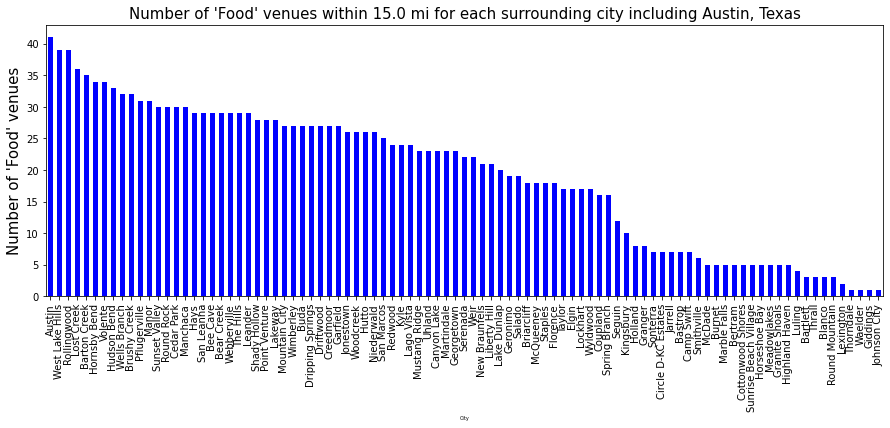

In [36]:
clr="blue"
df_total_venue_per_city = total_venue_per_city[['City', 'Category']]
df_total_venue_per_city = df_total_venue_per_city.groupby(["City"]).count()
df_total_venue_per_city = df_total_venue_per_city.sort_values(by=['Category'],ascending=False)
df_total_venue_per_city.plot.bar(figsize=(15,5), color=clr, legend=None)
plt.title('Number of \'{}\' venues within {} mi for each surrounding city including {}'.format(search_venue,city_radius/1600,address), fontsize = 15)
plt.xlabel('City',fontsize = 5)
plt.ylabel('Number of \'{}\' venues'.format(search_venue),fontsize = 15)
plt.xticks(rotation=90)
plt.show()

#### Let's visualize these venues along with the surrounding cities

In [37]:
map_total_venues = folium.Map(location=[latitude, longitude], zoom_start=12) # generate map centred around the main city

# add a red circle marker to represent the main city
folium.CircleMarker(
    [latitude, longitude],
    radius=10,
    color='red',
    popup= address,
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(map_total_venues)

# add surrounding city markers as green circles to map
for lat, lng, city, city_of_interest in zip(df_cities_of_interest['lat'], df_cities_of_interest['lng'], df_cities_of_interest['city'], df_cities_of_interest['city_of_interest']):
    if city_of_interest == True:
        label = '{}'.format(city)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='green',
            fill=True,
            fill_color='green',
            fill_opacity=0.7,
            parse_html=False).add_to(map_total_venues)  
    
    
# add the venues as blue circle markers
for city in total_venue_results :
    venue = total_venue_results[city]
    for lat, lng, name in zip(venue.lat, venue.lng, venue.name):
        label1 = '{}'.format(name)
        label = folium.Popup(label1, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=2.5,
            color='blue',
            popup=label,
            fill = True,
            fill_color='blue',
            fill_opacity=0.6
        ).add_to(map_total_venues)

# display map
map_total_venues

#### Analyze each city

In [38]:
# one hot encoding
total_city_onehot = pd.get_dummies(total_venue_per_city[['Category']], prefix="", prefix_sep="")

# add city column back to dataframe
total_city_onehot['City'] = total_venue_per_city['City'] 

# move city column to the first column
total_fixed_columns = [total_city_onehot.columns[-1]] + list(total_city_onehot.columns[:-1])
total_city_onehot = total_city_onehot[total_fixed_columns]

#### and examine the new dataframe

In [39]:
print(total_city_onehot.shape)
#total_city_onehot

(1942, 59)


In [40]:
total_city_grouped = total_city_onehot.groupby('City').mean().reset_index()

#### Let's print each city along with the top 5 most common venues

In [41]:
num_top_venues = 5

#for city in total_city_grouped['City']:
#    print("----"+city+"----")
#    temp = total_city_grouped[total_city_grouped['City'] == city].T.reset_index()
#    temp.columns = ['venue','freq']
#    temp = temp.iloc[1:]
#    temp['freq'] = temp['freq'].astype(float)
#    temp = temp.round({'freq': 2})
#    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
#    print('\n')

#### Let's put that into a pandas dataframe

In [42]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [43]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['city']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
city_venues_sorted = pd.DataFrame(columns=columns)
city_venues_sorted['city'] = total_city_grouped['City']

for ind in np.arange(total_city_grouped.shape[0]):
    city_venues_sorted.iloc[ind, 1:] = return_most_common_venues(total_city_grouped.iloc[ind, :], num_top_venues)

city_venues_sorted.head(12)

,city,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Austin,Food Truck,Sandwich Place,New American Restaurant,Japanese Restaurant,Israeli Restaurant,Deli / Bodega,Comfort Food Restaurant,Fast Food Restaurant,Café,Mediterranean Restaurant
1,Bartlett,Truck Stop,Cajun / Creole Restaurant,Mexican Restaurant,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint
2,Barton Creek,Food Truck,Food Court,Japanese Restaurant,New American Restaurant,Sandwich Place,Restaurant,Health Food Store,Food & Drink Shop,Fast Food Restaurant,Juice Bar
3,Bastrop,Southern / Soul Food Restaurant,Food Truck,Asian Restaurant,Mexican Restaurant,Burger Joint,Fruit & Vegetable Store,Caribbean Restaurant,Fast Food Restaurant,Food & Drink Shop,Food Court
4,Bear Creek,Food Truck,Mexican Restaurant,Food Court,Japanese Restaurant,New American Restaurant,Food & Drink Shop,Restaurant,Sandwich Place,Fast Food Restaurant,Deli / Bodega
5,Bee Cave,Food Truck,Food Court,Japanese Restaurant,New American Restaurant,Sandwich Place,American Restaurant,Burger Joint,Mexican Restaurant,Thai Restaurant,BBQ Joint
6,Bertram,Food Truck,Himalayan Restaurant,Farmers Market,Restaurant,Bar,Dessert Shop,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
7,Blanco,Beer Garden,Food Truck,Mexican Restaurant,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint
8,Briarcliff,Food Truck,American Restaurant,Burger Joint,Korean Restaurant,Food Court,Gluten-free Restaurant,Greek Restaurant,Thai Restaurant,Beer Garden,Fast Food Restaurant
9,Brushy Creek,Food Truck,Food Court,Japanese Restaurant,Mexican Restaurant,New American Restaurant,Korean Restaurant,Restaurant,Sandwich Place,Market,Mediterranean Restaurant


#### Which cities had BBQ joints in the top 10?

In [44]:
city_venues_sorted[city_venues_sorted.isin(['BBQ Joint']).any(axis=1)]

,city,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,Bee Cave,Food Truck,Food Court,Japanese Restaurant,New American Restaurant,Sandwich Place,American Restaurant,Burger Joint,Mexican Restaurant,Thai Restaurant,BBQ Joint
10,Buda,Food Truck,Mexican Restaurant,New American Restaurant,Deli / Bodega,BBQ Joint,Food Court,Food & Drink Shop,Fast Food Restaurant,Restaurant,Wine Bar
43,Lakeway,Food Truck,Food Court,Japanese Restaurant,Burger Joint,New American Restaurant,Sandwich Place,American Restaurant,Mexican Restaurant,Thai Restaurant,BBQ Joint
48,Lost Creek,Food Truck,Food Court,Japanese Restaurant,Sandwich Place,New American Restaurant,Wine Bar,Organic Grocery,BBQ Joint,Cafeteria,Deli / Bodega
49,Luling,Mexican Restaurant,BBQ Joint,Bar,Wine Bar,Dessert Shop,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint
51,Manor,Food Truck,Food Court,Japanese Restaurant,American Restaurant,Mexican Restaurant,New American Restaurant,Taco Place,Restaurant,Gourmet Shop,BBQ Joint
57,Mountain City,Food Truck,Mexican Restaurant,Food Court,New American Restaurant,Deli / Bodega,BBQ Joint,Food & Drink Shop,Fast Food Restaurant,Restaurant,Wine Bar
60,Niederwald,Food Truck,Mexican Restaurant,Deli / Bodega,BBQ Joint,Food Court,Food & Drink Shop,Fast Food Restaurant,New American Restaurant,Dessert Shop,Gourmet Shop
61,Pflugerville,Food Truck,Food Court,Japanese Restaurant,American Restaurant,Mexican Restaurant,New American Restaurant,Taco Place,Restaurant,Gourmet Shop,BBQ Joint
80,The Hills,Food Court,Food Truck,Japanese Restaurant,Burger Joint,New American Restaurant,Sandwich Place,American Restaurant,Mexican Restaurant,Thai Restaurant,BBQ Joint


In [45]:
city_venues_sorted.loc[city_venues_sorted['city'] == 'Lockhart']

,city,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
47,Lockhart,Mexican Restaurant,Food Truck,Bar,Food Court,Food & Drink Shop,Chinese Restaurant,Music Venue,Wine Bar,Dessert Shop,Gourmet Shop


### Cluster City Analysis

#### Let's run k-means to cluster the cities into 5 clusters

In [46]:
# set number of clusters
kclusters = 5

total_city_grouped_clustering = total_city_grouped.drop('City', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(total_city_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 1, 2, 4, 0, 2, 0, 1, 2, 2])

#### Let's create a new dataframe that includes the city clusters as well as the top 10 venues for each city

In [47]:
# add clustering labels
city_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

cluster_areas_merged = df_cities_of_interest

# merge cluster_areas_merged with toronto_data to add latitude/longitude for each city
cluster_areas_merged = cluster_areas_merged.join(city_venues_sorted.set_index('city'), on='city')

cluster_areas_merged.head() # check the last columns!

,lat,lng,city,city_of_interest,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1150,30.271129,-97.7437,Austin,True,0,Food Truck,Sandwich Place,New American Restaurant,Japanese Restaurant,Israeli Restaurant,Deli / Bodega,Comfort Food Restaurant,Fast Food Restaurant,Café,Mediterranean Restaurant
1458,30.795100,-97.4325,Bartlett,True,1,Truck Stop,Cajun / Creole Restaurant,Mexican Restaurant,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint
1464,30.281800,-97.8681,Barton Creek,True,2,Food Truck,Food Court,Japanese Restaurant,New American Restaurant,Sandwich Place,Restaurant,Health Food Store,Food & Drink Shop,Fast Food Restaurant,Juice Bar
1494,30.111800,-97.3257,Bastrop,True,4,Southern / Soul Food Restaurant,Food Truck,Asian Restaurant,Mexican Restaurant,Burger Joint,Fruit & Vegetable Store,Caribbean Restaurant,Fast Food Restaurant,Food & Drink Shop,Food Court
1625,30.182600,-97.9400,Bear Creek,True,0,Food Truck,Mexican Restaurant,Food Court,Japanese Restaurant,New American Restaurant,Food & Drink Shop,Restaurant,Sandwich Place,Fast Food Restaurant,Deli / Bodega


#### let's visualize the resulting city clusters

In [48]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(cluster_areas_merged['lat'], cluster_areas_merged['lng'], cluster_areas_merged['city'], cluster_areas_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

#### Now, examine each city cluster and list the discriminating venue categories that distinguish each cluster.

#### Cluster 1

In [49]:
cluster_areas_merged.loc[cluster_areas_merged['Cluster Labels'] == 0, cluster_areas_merged.columns[[2] + list(range(5, cluster_areas_merged.shape[1]))]]

,city,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1150,Austin,Food Truck,Sandwich Place,New American Restaurant,Japanese Restaurant,Israeli Restaurant,Deli / Bodega,Comfort Food Restaurant,Fast Food Restaurant,Café,Mediterranean Restaurant
1625,Bear Creek,Food Truck,Mexican Restaurant,Food Court,Japanese Restaurant,New American Restaurant,Food & Drink Shop,Restaurant,Sandwich Place,Fast Food Restaurant,Deli / Bodega
2044,Bertram,Food Truck,Himalayan Restaurant,Farmers Market,Restaurant,Bar,Dessert Shop,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
3242,Buda,Food Truck,Mexican Restaurant,New American Restaurant,Deli / Bodega,BBQ Joint,Food Court,Food & Drink Shop,Fast Food Restaurant,Restaurant,Wine Bar
5763,Creedmoor,Food Truck,Mexican Restaurant,Japanese Restaurant,Deli / Bodega,Restaurant,Sandwich Place,Fast Food Restaurant,Food & Drink Shop,American Restaurant,Food Court
6844,Driftwood,Food Truck,Mexican Restaurant,Food Court,Restaurant,New American Restaurant,Liquor Store,Chinese Restaurant,Wine Bar,Gluten-free Restaurant,German Restaurant
6848,Dripping Springs,Food Truck,Food Court,Mexican Restaurant,Restaurant,American Restaurant,Venezuelan Restaurant,Liquor Store,Farmers Market,New American Restaurant,Deli / Bodega
11010,Hays,Food Truck,Mexican Restaurant,Food Court,New American Restaurant,Restaurant,Sandwich Place,Fast Food Restaurant,Food & Drink Shop,Deli / Bodega,Japanese Restaurant
12553,Johnson City,Food Truck,Wine Bar,Deli / Bodega,Greek Restaurant,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint,Food Court
15306,Manchaca,Food Truck,Mexican Restaurant,Food Court,Japanese Restaurant,Food & Drink Shop,Restaurant,Sandwich Place,Fast Food Restaurant,American Restaurant,New American Restaurant


#### Cluster 2

In [50]:
cluster_areas_merged.loc[cluster_areas_merged['Cluster Labels'] == 1, cluster_areas_merged.columns[[2] + list(range(5, cluster_areas_merged.shape[1]))]]

,city,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1458,Bartlett,Truck Stop,Cajun / Creole Restaurant,Mexican Restaurant,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint
2339,Blanco,Beer Garden,Food Truck,Mexican Restaurant,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint
3794,Canyon Lake,Mexican Restaurant,Food Truck,Food Court,Liquor Store,Snack Place,German Restaurant,Pizza Place,Chinese Restaurant,Food & Drink Shop,Italian Restaurant
9524,Geronimo,Mexican Restaurant,Food Truck,Food Court,Liquor Store,Snack Place,Health Food Store,German Restaurant,Food & Drink Shop,Music Venue,Deli / Bodega
9560,Giddings,Mexican Restaurant,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint,Food Truck,Food Court
10054,Granger,Mexican Restaurant,Taco Place,Dessert Shop,Restaurant,Cajun / Creole Restaurant,Food Truck,Truck Stop,Fruit & Vegetable Store,Fried Chicken Joint,Deli / Bodega
12417,Jarrell,Food Truck,Mexican Restaurant,Truck Stop,Cajun / Creole Restaurant,Restaurant,Wine Bar,Deli / Bodega,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
13071,Kingsbury,Mexican Restaurant,Bar,Food Truck,Food Court,Snack Place,Liquor Store,Music Venue,Wine Bar,Dessert Shop,Gluten-free Restaurant
13273,Kyle,Food Truck,Mexican Restaurant,Food Court,New American Restaurant,Food & Drink Shop,Liquor Store,Snack Place,Chinese Restaurant,Wine Bar,Gluten-free Restaurant
13549,Lake Dunlap,Food Court,Mexican Restaurant,Food Truck,Snack Place,Health Food Store,German Restaurant,Italian Restaurant,Liquor Store,Food & Drink Shop,Deli / Bodega


#### Cluster 3

In [51]:
cluster_areas_merged.loc[cluster_areas_merged['Cluster Labels'] == 2, cluster_areas_merged.columns[[2] + list(range(5, cluster_areas_merged.shape[1]))]]

,city,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1464,Barton Creek,Food Truck,Food Court,Japanese Restaurant,New American Restaurant,Sandwich Place,Restaurant,Health Food Store,Food & Drink Shop,Fast Food Restaurant,Juice Bar
1716,Bee Cave,Food Truck,Food Court,Japanese Restaurant,New American Restaurant,Sandwich Place,American Restaurant,Burger Joint,Mexican Restaurant,Thai Restaurant,BBQ Joint
2882,Briarcliff,Food Truck,American Restaurant,Burger Joint,Korean Restaurant,Food Court,Gluten-free Restaurant,Greek Restaurant,Thai Restaurant,Beer Garden,Fast Food Restaurant
3171,Brushy Creek,Food Truck,Food Court,Japanese Restaurant,Mexican Restaurant,New American Restaurant,Korean Restaurant,Restaurant,Sandwich Place,Market,Mediterranean Restaurant
4166,Cedar Park,Food Truck,Food Court,Japanese Restaurant,Korean Restaurant,Himalayan Restaurant,New American Restaurant,Burger Joint,Chinese Restaurant,Gluten-free Restaurant,Greek Restaurant
5656,Coupland,American Restaurant,Food Truck,Food Court,Food & Drink Shop,Burger Joint,Gourmet Shop,Restaurant,Candy Store,Mediterranean Restaurant,Mexican Restaurant
7570,Elgin,Food Truck,American Restaurant,Candy Store,Food Court,Food & Drink Shop,Market,Mediterranean Restaurant,Mexican Restaurant,Restaurant,Gourmet Shop
8583,Florence,Food Truck,Restaurant,Himalayan Restaurant,Seafood Restaurant,Cajun / Creole Restaurant,Food Court,Mexican Restaurant,Salad Place,American Restaurant,Southern / Soul Food Restaurant
9360,Garfield,Food Truck,Japanese Restaurant,Sandwich Place,Gourmet Shop,Fast Food Restaurant,New American Restaurant,Deli / Bodega,Restaurant,Mediterranean Restaurant,Snack Place
9489,Georgetown,Food Truck,Food Court,Mexican Restaurant,Himalayan Restaurant,Restaurant,Burger Joint,Cajun / Creole Restaurant,Korean Restaurant,New American Restaurant,American Restaurant


#### Cluster 4

In [52]:
cluster_areas_merged.loc[cluster_areas_merged['Cluster Labels'] == 3, cluster_areas_merged.columns[[2] + list(range(5, cluster_areas_merged.shape[1]))]]

,city,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3370,Burnet,Food Truck,Mexican Restaurant,Farmers Market,Coffee Shop,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
5624,Cottonwood Shores,Food Truck,Mexican Restaurant,Farmers Market,Coffee Shop,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
10072,Granite Shoals,Food Truck,Mexican Restaurant,Farmers Market,Coffee Shop,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
11337,Highland Haven,Food Truck,Mexican Restaurant,Farmers Market,Coffee Shop,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
11752,Horseshoe Bay,Food Truck,Mexican Restaurant,Farmers Market,Coffee Shop,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
15467,Marble Falls,Food Truck,Mexican Restaurant,Farmers Market,Coffee Shop,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
16026,Meadowlakes,Food Truck,Mexican Restaurant,Farmers Market,Coffee Shop,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store
24739,Sunrise Beach Village,Food Truck,Mexican Restaurant,Farmers Market,Coffee Shop,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store


#### Cluster 5

In [53]:
cluster_areas_merged.loc[cluster_areas_merged['Cluster Labels'] == 4, cluster_areas_merged.columns[[2] + list(range(5, cluster_areas_merged.shape[1]))]]

,city,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1494,Bastrop,Southern / Soul Food Restaurant,Food Truck,Asian Restaurant,Mexican Restaurant,Burger Joint,Fruit & Vegetable Store,Caribbean Restaurant,Fast Food Restaurant,Food & Drink Shop,Food Court
3683,Camp Swift,Southern / Soul Food Restaurant,Food Truck,Asian Restaurant,Mexican Restaurant,Burger Joint,Fruit & Vegetable Store,Caribbean Restaurant,Fast Food Restaurant,Food & Drink Shop,Food Court
4719,Circle D-KC Estates,Southern / Soul Food Restaurant,Food Truck,Asian Restaurant,Mexican Restaurant,Burger Joint,Fruit & Vegetable Store,Caribbean Restaurant,Fast Food Restaurant,Food & Drink Shop,Food Court
11540,Holland,Food Truck,Fast Food Restaurant,Fruit & Vegetable Store,Snack Place,Mexican Restaurant,Salad Place,Wine Bar,Comfort Food Restaurant,Gluten-free Restaurant,German Restaurant
14330,Lexington,Greek Restaurant,Mexican Restaurant,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint,Food Truck,Food Court
15905,McDade,Asian Restaurant,Burger Joint,Food Truck,Caribbean Restaurant,Mexican Restaurant,Wine Bar,Dessert Shop,Gourmet Shop,Gluten-free Restaurant,German Restaurant
23470,Smithville,Asian Restaurant,Burger Joint,Fruit & Vegetable Store,Food Truck,Caribbean Restaurant,Mexican Restaurant,Wine Bar,Dessert Shop,Gourmet Shop,Gluten-free Restaurant
25229,Thorndale,Greek Restaurant,Wine Bar,Deli / Bodega,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint,Food Truck,Food Court
25251,Thrall,Greek Restaurant,Taco Place,Dessert Shop,Comfort Food Restaurant,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint,Food Truck
26411,Waelder,BBQ Joint,Wine Bar,Deli / Bodega,Greek Restaurant,Gourmet Shop,Gluten-free Restaurant,German Restaurant,Fruit & Vegetable Store,Fried Chicken Joint,Food Truck


In [54]:
#cluster_areas_merged